In [280]:
import pandas as pd

In [281]:
df=pd.read_csv('Data/Wholesale Customers data.csv')

In [282]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [283]:
df= df.rename(columns={'Delicassen': 'Delicatessen'})
df['Channel']=df['Channel'].map({1: 'HoReCa', 2:'Retail'})
df['Region']=df['Region'].map({1: 'Lisbon', 2: 'Porto', 3:'Other'})


In [284]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [285]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [286]:
features=[
    #'Channel',
     #'Region',
     'Fresh',
     'Milk',
     'Grocery',
     'Frozen',
     'Detergents_Paper',
     'Delicatessen'
]

df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [287]:
df.to_csv('data/data_processed.csv')

## Task 2: Exploratory Data Analysis

In [288]:
import pandas as pd

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format='svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [289]:
df=pd.read_csv('Data/data_processed.csv', index_col=0)

In [290]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [291]:
df.Region.value_counts()

Region
Other     316
Lisbon     77
Porto      47
Name: count, dtype: int64

In [292]:
df.Channel.value_counts()

Channel
HoReCa    298
Retail    142
Name: count, dtype: int64

In [293]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [294]:
features=[
         'Channel',
         'Region',
         'Fresh',
         'Milk',
         'Grocery',
         'Frozen',
         'Detergents_Paper',
         'Delicatessen'
]

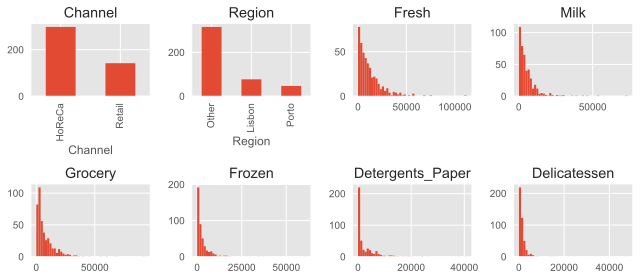

In [295]:
fig, axes=plt.subplots(2, 4, figsize=(9, 4))

for feature, ax in zip(features, axes.ravel()):
    if (feature=='Channel')|(feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax)
    else:
        ax.hist(df[feature], bins=50)
    ax.set_title(feature)

plt.tight_layout()


In [296]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

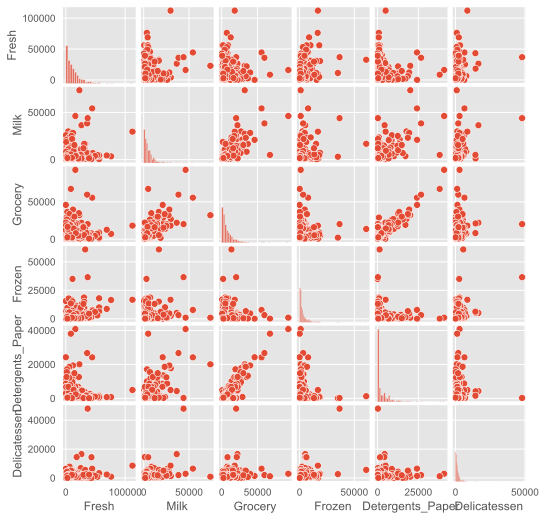

In [297]:
pplot=sns.pairplot(df, vars=features[2:])
pplot.fig.set_size_inches(7,7)

## Principle Component Analysis

In [298]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import numpy as np 

In [299]:
features=[
         #'Channel',
         #'Region',
         'Fresh',
         'Milk',
         'Grocery',
         'Frozen',
         'Detergents_Paper',
         'Delicatessen'
]

In [300]:
df=pd.read_csv('Data/data_processed.csv', index_col=0)

In [301]:
data=df[features].to_numpy()
data.shape

(440, 6)

In [302]:
scaler=StandardScaler()
data=scaler.fit_transform(data)
data[:, 0].std()

1.0

In [303]:
data

array([[ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
        -0.06633906],
       [-0.39130197,  0.54445767,  0.17031835, -0.27013618,  0.08640684,
         0.08915105],
       [-0.44702926,  0.40853771, -0.0281571 , -0.13753572,  0.13323164,
         2.24329255],
       ...,
       [ 0.20032554,  1.31467078,  2.34838631, -0.54337975,  2.51121768,
         0.12145607],
       [-0.13538389, -0.51753572, -0.60251388, -0.41944059, -0.56977032,
         0.21304614],
       [-0.72930698, -0.5559243 , -0.57322717, -0.62009417, -0.50488752,
        -0.52286938]])

In [304]:
np.save('Data/training_data.npy', data)

In [305]:
pca=PCA(n_components=2)
res_pca=pca.fit_transform(data)

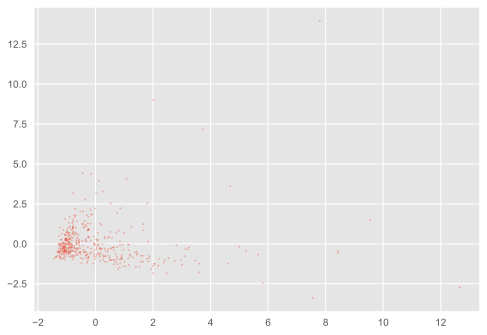

In [306]:
plt.scatter(res_pca[:, 0], res_pca[:,1], s=2, alpha=0.3)

In [307]:
features

['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicatessen']

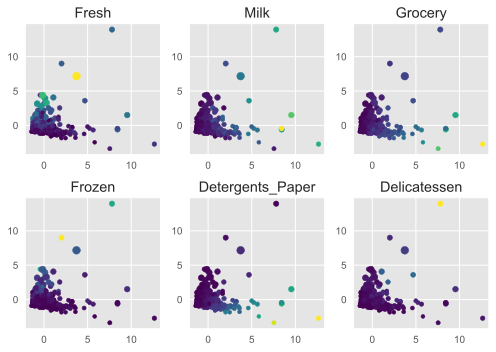

In [308]:
fig, axes=plt.subplots(2, 3, figsize=(7,5))

for feature, ax in zip(features, axes.ravel()):
    cmap='viridis'
    sizes=20+5*data[:, feature.index(feature)]
    cols=df[feature]
    ax.scatter(res_pca[:, 0], res_pca[:, 1], s=sizes, c=cols, cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

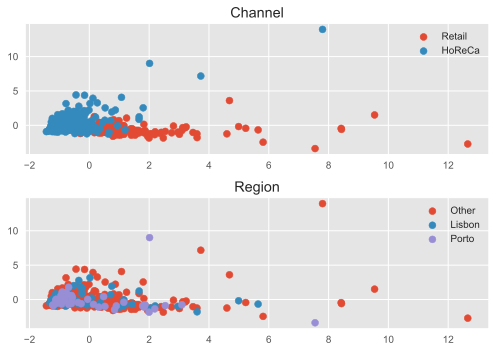

In [309]:
fig, axes=plt.subplots(2, 1, figsize=(7,5))

for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
    cmap='pastel'
    sizes=20
    for unique_val in df[feature].unique():
        ax.scatter(
            res_pca[df[feature]==unique_val, 0],
            res_pca[df[feature]==unique_val, 1],
            label=unique_val
        ) 
        ax.set_title(feature)
        ax.legend()
plt.tight_layout()


## Kernel Principal Component Analysis

In [310]:
from sklearn.decomposition import KernelPCA


import matplotlib
plt.style.use('ggplot')

In [311]:
df=pd.read_csv('Data/data_processed.csv', index_col=0)
data=np.load('Data/training_data.npy')

### polynomial Function

In [312]:
kpca=KernelPCA(n_components=2, kernel='poly',degree=2)
res_kpca_poly=kpca.fit_transform(data)

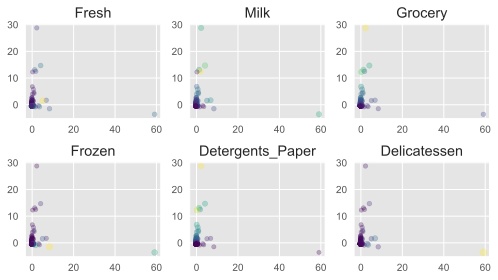

In [313]:
fig, axes=plt.subplots(2, 3, figsize=(7,4))

for feature, ax in zip(features, axes.ravel()):
    cmap='viridis'
    sizes=20+2*data[:, features.index(feature)]
    ax.scatter(res_kpca_poly[:, 0], res_kpca_poly[:, 1], s=sizes, 
               alpha=0.3, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

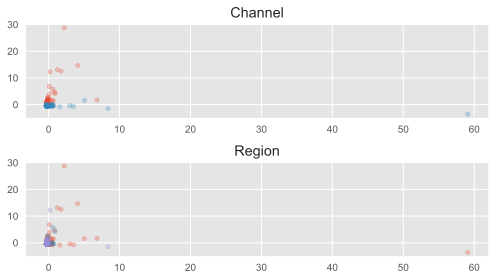

In [314]:
fig, axes=plt.subplots(2,1, figsize=(7,4))
for feature, ax in zip(['Channel','Region'], axes):
    cols='Pastel'
    sizes=20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_poly[df[feature]==unique_val, 0],
                   res_kpca_poly[df[feature]==unique_val, 1],
                   s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

### Radial basis function

In [315]:
kpca=KernelPCA(n_components=2, kernel='rbf', gamma=0.03)
res_kpca_rbf=kpca.fit_transform(data)

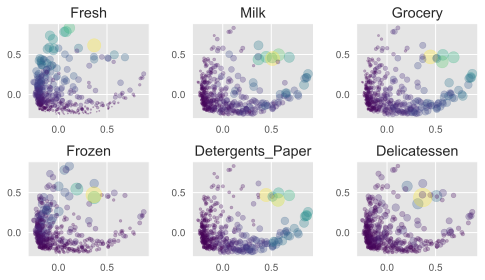

In [316]:
fig, axes=plt.subplots(2, 3, figsize=(7,4))

for feature, ax in zip(features, axes.ravel()):
    cmap='viridis'
    sizes=20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_rbf[:, 0], res_kpca_rbf[:, 1], s=sizes, 
               alpha=0.3, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

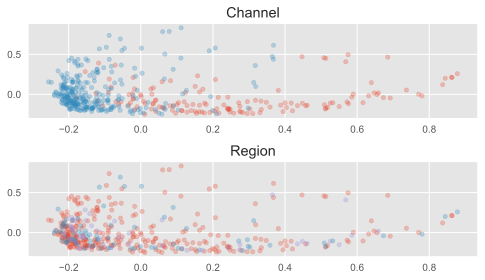

In [317]:
fig, axes=plt.subplots(2,1, figsize=(7,4))
for feature, ax in zip(['Channel','Region'], axes):
    cols='Pastel'
    sizes=20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0],
                   res_kpca_rbf[df[feature]==unique_val, 1],
                   s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

### Cosine Function

In [318]:
kpca=KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos=kpca.fit_transform(data)

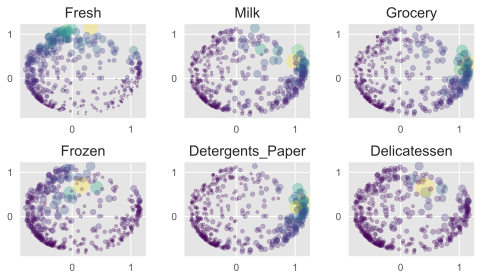

In [319]:
fig, axes=plt.subplots(2, 3, figsize=(7,4))

for feature, ax in zip(features, axes.ravel()):
    cmap='viridis'
    sizes=20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_cos[:, 0], res_kpca_cos[:, 1], s=sizes, 
               alpha=0.3, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

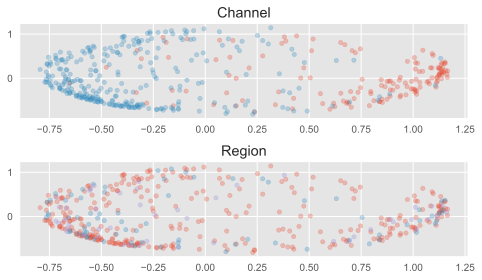

In [320]:
fig, axes=plt.subplots(2,1, figsize=(7,4))
for feature, ax in zip(['Channel','Region'], axes):
    cols='Pastel'
    sizes=20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_cos[df[feature]==unique_val, 0],
                   res_kpca_cos[df[feature]==unique_val, 1],
                   s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

### Append to DataFrame

In [321]:
df['x_kpca_poly']=res_kpca_poly[:, 0]
df['y_kpca_poly']=res_kpca_poly[:, 1]

df['x_kpca_rbf']=res_kpca_rbf[:, 0]
df['y_kpca_rbf']=res_kpca_rbf[:, 1]

df['x_kpca_cos']=res_kpca_cos[:, 0]
df['y_kpca_cos']=res_kpca_cos[:, 1]

In [322]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.040162,-0.075994,0.504789,0.009622
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.100603,-0.125001,0.889941,-0.262833
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.162976,0.029854,0.473994,0.235687
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.179096,0.082102,-0.618611,0.370131
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,-0.021263,0.210969,0.068900,0.861829


In [323]:
df.to_csv('Data/data_with_latent.csv')

## Task 5: k-means Clustering

In [324]:
import os

# Set OMP_NUM_THREADS environment variable
os.environ["OMP_NUM_THREADS"] = "2"

In [325]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

In [326]:
df=pd.read_csv('Data/data_with_latent.csv', index_col=0)
data=np.load('Data/training_data.npy')

In [327]:
res_kpca=df[['x_kpca_cos', 'y_kpca_cos']].to_numpy()

In [328]:
clusterer=KMeans(n_clusters=5)
clusters=clusterer.fit_predict(res_kpca)

D:\Anaconda\k\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [329]:
clusters[:5]

array([4, 2, 2, 3, 0])

In [330]:
markers=list('*hH+xXDd|.,ov^<>12348spP')

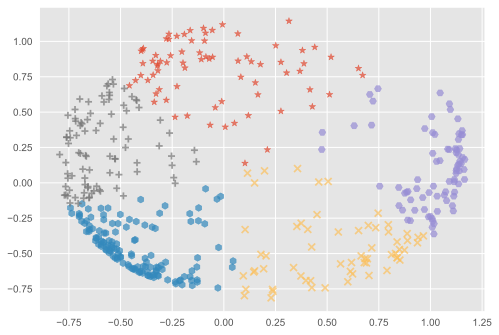

In [331]:
for cluster in np.unique(clusters):
    cluster_data=res_kpca[clusters==cluster]
    plt.scatter(
        cluster_data[:,0], 
        cluster_data[:,1],
        alpha=0.7,
        marker=markers[cluster]
    )

C:\Users\Uzma\AppData\Local\Temp\ipykernel_8224\3343338212.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


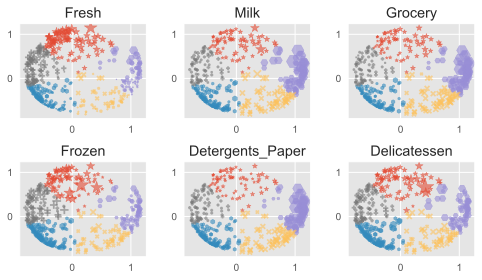

In [332]:
fig, axes=plt.subplots(2, 3, figsize=(7,4))

for feature, ax in zip(features, axes.ravel()):
    cmap='viridis'
    for cluster in np.unique(clusters):
        cluster_data=res_kpca[clusters==cluster]    
        sizes=20+20*data[:, features.index(feature)][clusters==cluster]
        ax.scatter(
            cluster_data[:, 0],
            cluster_data[:, 1],
            s=sizes,
            alpha=0.6,
            cmap=cmap,
            marker=markers[cluster]
        )
    ax.set_title(feature)
plt.tight_layout()

In [333]:
df['cluster_kpca_cos']=clusters
df.to_csv('Data/data_with_clusters.csv')

### Elbow method

D:\Anaconda\k\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
D:\Anaconda\k\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
D:\Anaconda\k\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
D:\Anaconda\k\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

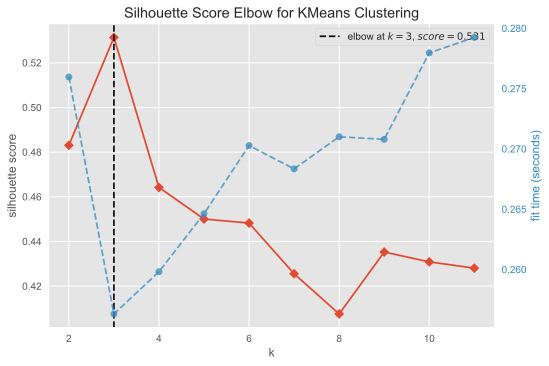

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [335]:
clusterer=KMeans()
visualizer=KElbowVisualizer(clusterer, k=(2,12), metric='silhouette')

visualizer.fit(res_kpca)
visualizer.show()

                            

## Task 6: Interactive cluster analysis

In [371]:
import plotly.graph_objects as go

In [372]:
df=pd.read_csv('Data/data_with_clusters.csv', index_col=0)
data=np.load('Data/training_data.npy')

In [373]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.040162,-0.075994,0.504789,0.009622,4
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.100603,-0.125001,0.889941,-0.262833,2
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.162976,0.029854,0.473994,0.235687,2
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.179096,0.082102,-0.618611,0.370131,3
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,-0.021263,0.210969,0.068900,0.861829,0


### Cluster Distribution

In [374]:
df.groupby(['cluster_kpca_cos', 'Channel','Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_cos Channel Region                                             
0                HoReCa  Lisbon  37747.142857   6045.857143   7376.142857   
                         Other   32946.382979   5885.468085   6021.255319   
                         Porto   31176.000000   9559.500000  10953.000000   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   23989.500000   6507.428571   9703.857143   
                         Porto   20117.666667   4662.666667   6631.000000   
1                HoReCa  Lisbon   5899.782609   2275.304348   2553.260870   
                         Other    4921.489130   2347.847826   2598.130435   
                         Porto    6042.916667   1783.500000   4275.416667   
                 Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                         Other   10750.000000   3468.666667   6065.333333   
                         Porto    7839.000000   2548.000000   6110.000000   
2                HoReCa  Lisbon   6364.666667  17421.333333  11328.333333   
                         Other   11908.500000  15602.500000  14858.000000   
                 Retail  Lisbon   4302.166667  13440.833333  23713.250000   
                         Other    8964.596154  15849.384615  22367.865385   
                         Porto    4998.900000  12905.200000  23565.600000   
3                HoReCa  Lisbon  16145.200000   1839.800000   2417.000000   
                         Other   15885.685185   1960.277778   2387.462963   
                         Porto   13667.714286   1714.142857   3561.642857   
                 Retail  Other   16085.666667   3109.666667   4594.000000   
4                HoReCa  Lisbon   3218.333333   7438.166667   7476.500000   
                         Other    2835.500000   6629.625000   8714.687500   
                 Retail  Lisbon   2443.333333   6128.333333   9281.333333   
                         Other    4539.060606   6606.030303  10429.969697   
                         Porto    3121.500000   6622.250000  10607.750000   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_cos Channel Region                                                
0                HoReCa  Lisbon   7186.714286        611.142857   2868.142857  
                         Other    8011.893617        912.127660   3631.404255  
                         Porto   31957.500000        821.500000   2863.000000  
                 Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                         Other    2002.500000       2929.285714   2431.571429  
                         Porto    4582.666667       2368.333333   2543.333333  
1                HoReCa  Lisbon   1647.913043        882.260870    635.043478  
                         Other    1643.750000        509.684783    879.217391  
                         Porto    1760.250000        513.583333    792.500000  
                 Retail  Lisbon   5612.000000        788.000000   1360.000000  
                         Other    1101.333333       3235.666667    336.333333  
                         Porto     936.000000       2960.000000    392.500000  
2                HoReCa  Lisbon   5405.000000       2735.000000   3096.333333  
                         Other    3388.000000       2680.500000   3507.000000  
                 Retail  Lisbon   2153.000000      10679.750000   2188.833333  
                         Other    1807.500000      10082.557692   2208.115385  
                         Porto    1106.200000      12201.800000   1326.400000  
3                HoReCa  Lisbon   3682.900000        349.750000   1045.000000  
                         Other    3999.814815        426.111111    825.555556  
                         Porto    5415.928571        407.857143   1123.500000  
                 Retail  Other    1181.666667       1537.000000   1096.333333  
4                HoReCa  Lisbon   1071.6666

In [375]:
df.groupby('cluster_kpca_cos').count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
cluster_kpca_cos,,,,,,,,,,,,,,
0,75,75,75,75,75,75,75,75,75,75,75,75,75,75
1,133,133,133,133,133,133,133,133,133,133,133,133,133,133
2,79,79,79,79,79,79,79,79,79,79,79,79,79,79
3,91,91,91,91,91,91,91,91,91,91,91,91,91,91
4,62,62,62,62,62,62,62,62,62,62,62,62,62,62


In [376]:
clusters=df.cluster_kpca_cos.tolist()

In [377]:
df_normalized=df.copy(deep=True)
df_normalized[features]=df_normalized[features]/df_normalized[features].max()

In [378]:
df_normalized.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,0.112964,0.131378,0.081494,0.003516,0.065496,0.027908,-0.298146,-0.307672,0.040162,-0.075994,0.504789,0.009622,4
1,Retail,Other,0.062924,0.133473,0.103126,0.028947,0.080657,0.037044,-0.272613,-0.248762,0.100603,-0.125001,0.889941,-0.262833,2
2,Retail,Other,0.056647,0.119840,0.082820,0.039511,0.086119,0.163611,0.557870,-0.356102,0.162976,0.029854,0.473994,0.235687,2
3,HoReCa,Other,0.118278,0.016273,0.045495,0.105210,0.012418,0.037294,-0.263419,-0.454023,-0.179096,0.082102,-0.618611,0.370131,3
4,Retail,Other,0.201648,0.073607,0.077581,0.064318,0.043525,0.108149,0.126922,-0.432733,-0.021263,0.210969,0.068900,0.861829,0


In [379]:
biggest_cluster=df.groupby('cluster_kpca_cos').count().max().max()
biggest_cluster

133

In [380]:
df_normalized.loc[df_normalized.cluster_kpca_cos==2, features].mean()

Fresh               0.068927
Milk                0.206323
Grocery             0.238354
Frozen              0.032000
Detergents_Paper    0.244326
Delicatessen        0.045057
dtype: float64

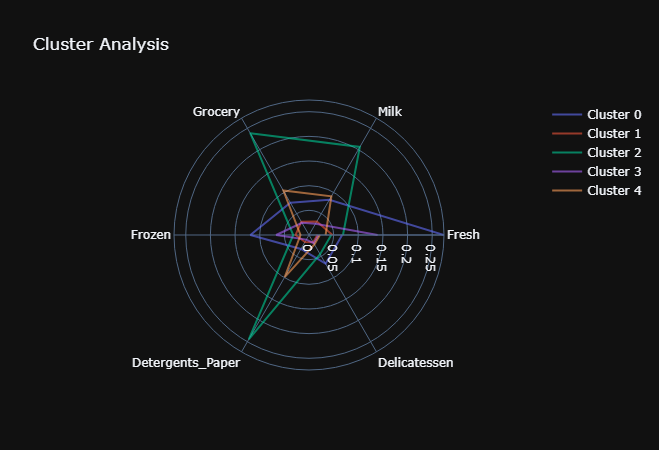

In [413]:
fig=go.Figure()

for cluster in np.unique(clusters):
    radii=df_normalized.loc[df_normalized.cluster_kpca_cos==cluster, 
    features].mean().tolist()


    thetas=features
    actual_values=df.loc[df.cluster_kpca_cos==cluster, 
                                features].mean().tolist()
    cluster_size=len(df.cluster_kpca_cos==cluster)
    fig.add_trace(
        go.Scatterpolar(
            r=radii+[radii[-1]],
            theta=thetas+[thetas[0]],
            mode='lines',
            name=f'Cluster {cluster}', 
            text=['Mean value:{x}' for x in actual_values+[actual_values[0]]],
            opacity=np.min([0.6,cluster_size/biggest_cluster]),
            line=dict(width=np.min([2,4*cluster_size/biggest_cluster]))

        )
    )
fig.update_layout(
    title='Cluster Analysis',
    template='plotly_dark',
    width=600,
    autosize=False)
fig.show()
    

In [415]:
fig.write_html('Demo.html')